# PC Variables Exploration

## Imports and Functions

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
from sklearn.preprocessing import MinMaxScaler
import scipy as sp
import os
import sys
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm


In [2]:
# Add the folder to the Python path

os.chdir("../")
# change working directory to project's root path
print(os.getcwd())

folder_path = os.path.abspath("functions/") #INPUT_PATH)#'path_to_your_folder')  # Replace with the actual folder path
sys.path.insert(0, folder_path)

c:\Users\marti\Desktop\data\hw_extra


In [3]:

from IndexDrivers import (
    MultivariatePCA, 
    plot_hw_index,
    plot_hw_index_by_season,
    scatter_color_year,
    scatter_color_season
)

In [4]:
def df_to_series(dataframe, name_series, years=[1979,2023]):
    selected = dataframe[(dataframe["Year"]< years[1]) & (dataframe["Year"] > years[0])]
    df_melted = selected.melt(id_vars=['Year'], var_name='Month', value_name=name_series)
    df_melted["Month"] = pd.to_numeric(df_melted["Month"])
    df_melted = df_melted.sort_values(['Year','Month'])

    df_melted['Date'] = pd.to_datetime(df_melted[['Year', 'Month']].assign(DAY=1))
    df_melted.set_index('Date', inplace=True)

    return df_melted.drop(columns=["Year", "Month"])

hwis = pd.read_csv("data/local_data/HWs_330020.csv")
hwis["Date"] = pd.to_datetime(hwis["Date"],format='%Y-%m')
hwis.set_index('Date', inplace=True)

In [5]:
ds_5means = xr.load_dataset("data/local_data/5means_world.nc")

## PCA on separated variables

### SST

In [6]:
pca_sst = MultivariatePCA(ds_5means, 2, [1980, 2022], variables=["SST"])

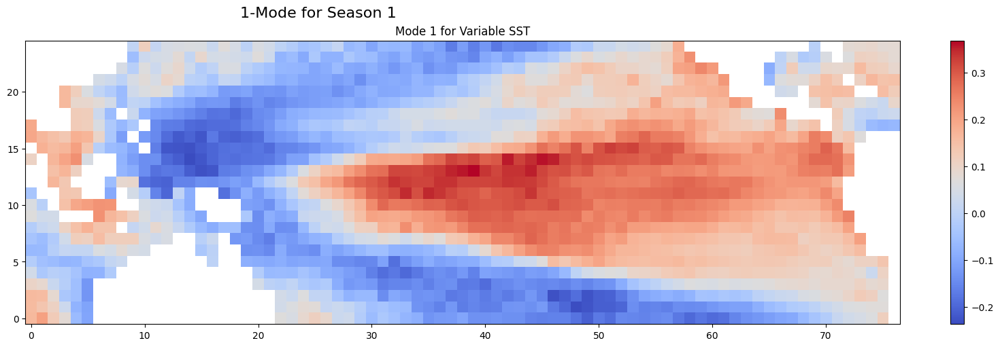

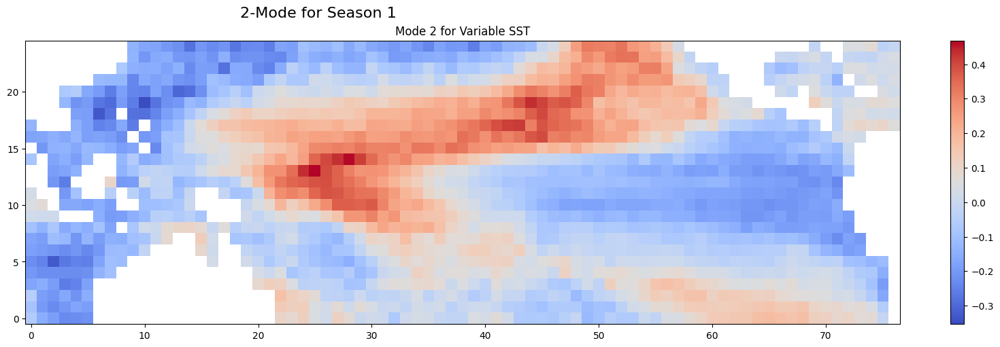

In [7]:
pca_sst.plot_variable_modes_shared(1)

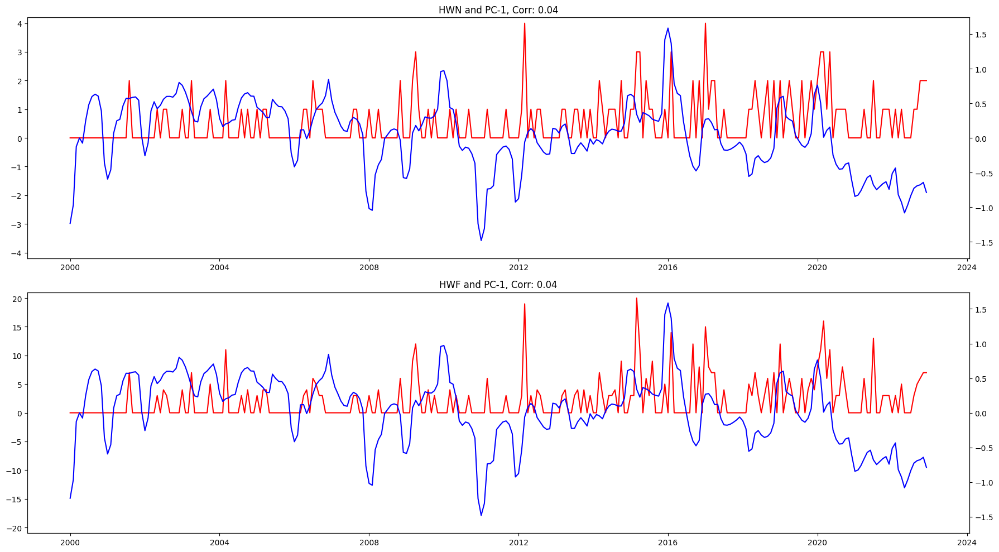

In [8]:
plot_hw_index(hwis, ["HWN", "HWF"], pca_sst, 1, start=2000)

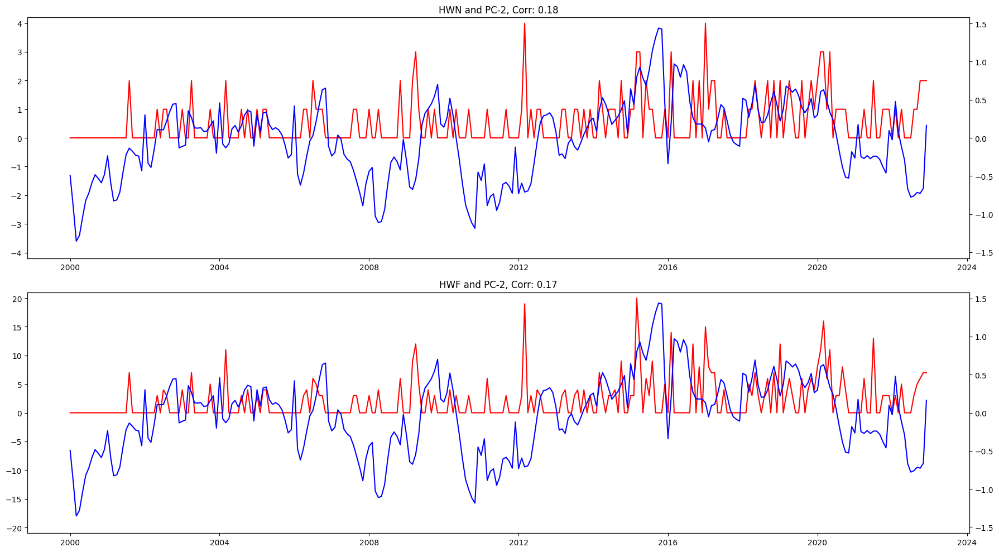

In [9]:
plot_hw_index(hwis, ["HWN", "HWF"], pca_sst, 2, start=2000)

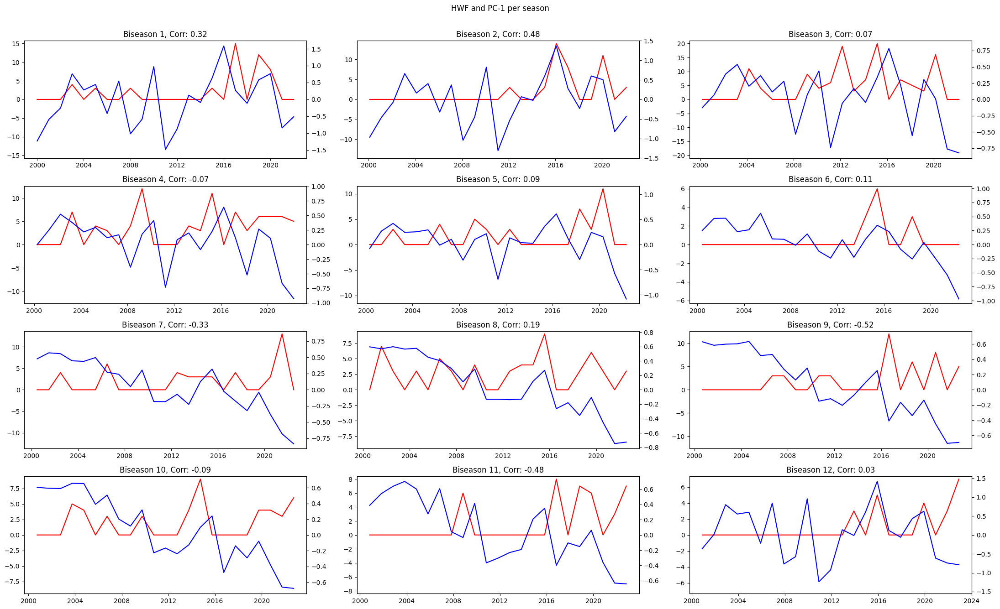

In [10]:
plot_hw_index_by_season(hwis, "HWF", pca_sst, 1, start=2000)

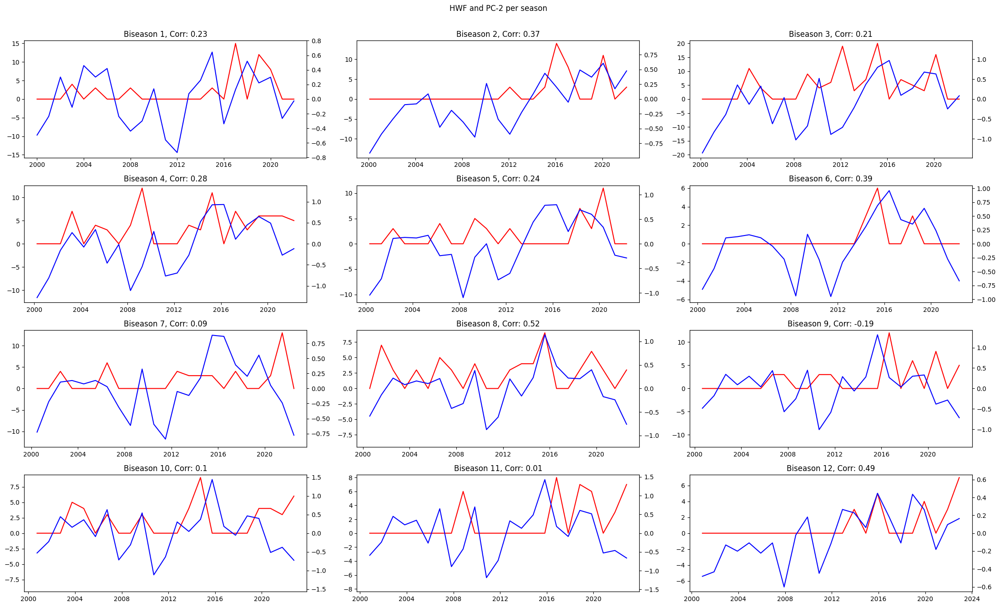

In [11]:
plot_hw_index_by_season(hwis, "HWF", pca_sst, 2, start=2000)

### SP

In [12]:
pca_sp = MultivariatePCA(ds_5means, 2, [1980, 2022], variables=["SP"])

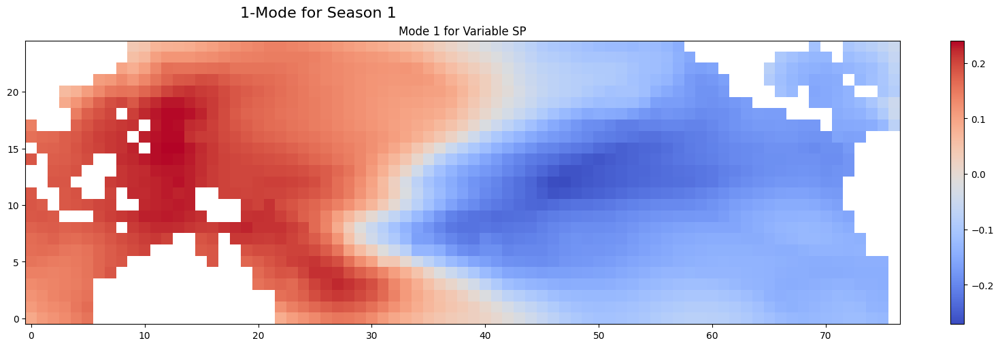

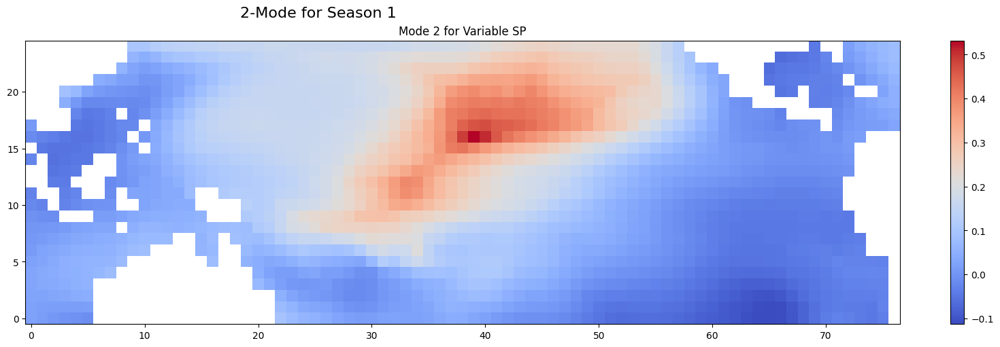

In [13]:
pca_sp.plot_variable_modes_shared(1)

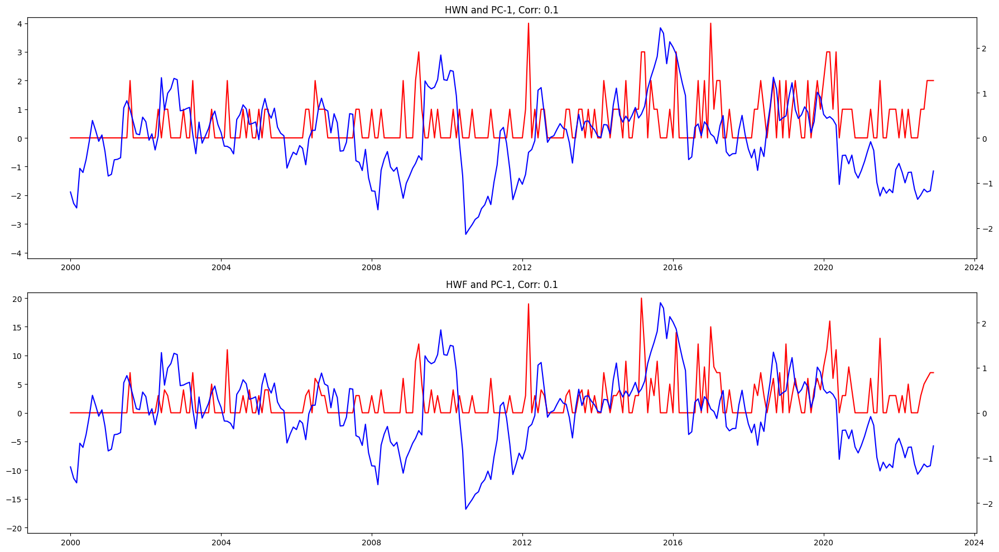

In [14]:
plot_hw_index(hwis, ["HWN", "HWF"], pca_sp, 1, start=2000)

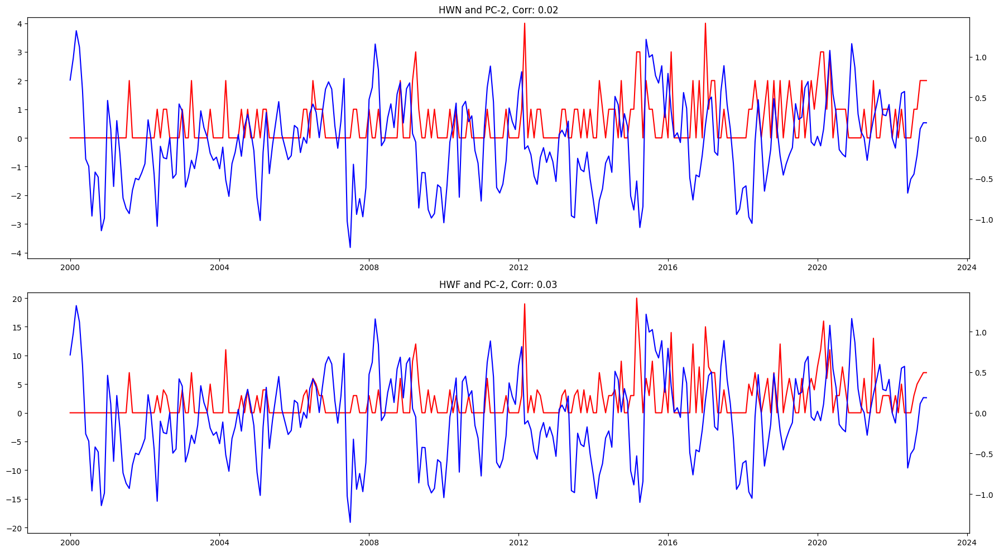

In [15]:
plot_hw_index(hwis, ["HWN", "HWF"], pca_sp, 2, start=2000)

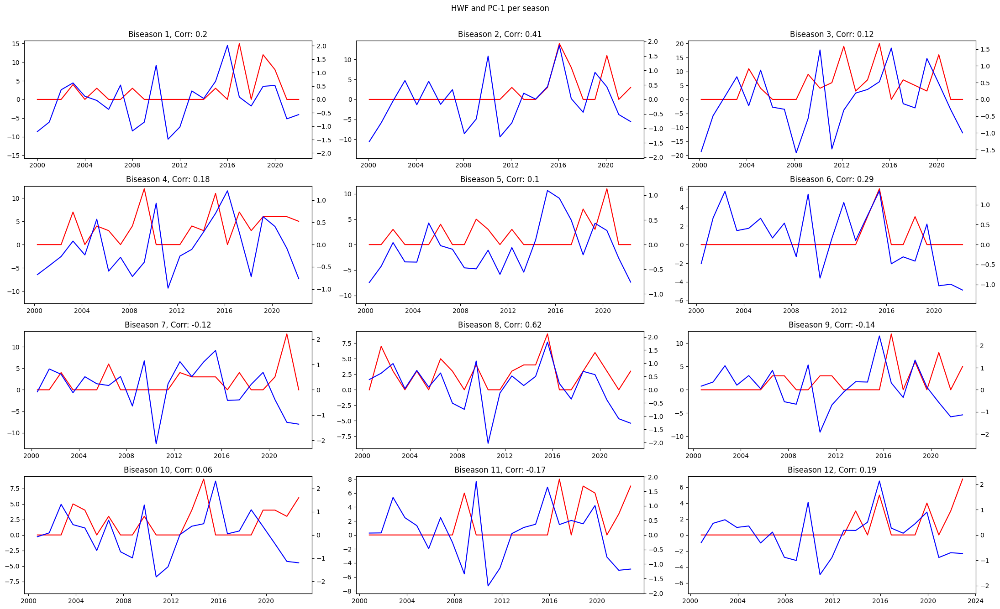

In [16]:
plot_hw_index_by_season(hwis, "HWF", pca_sp, 1, start=2000)

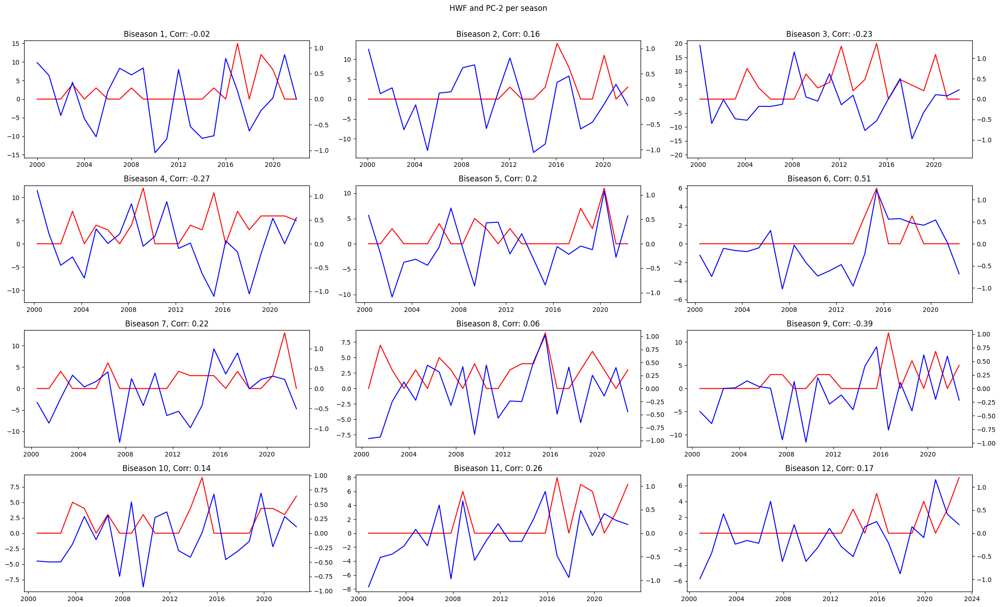

In [17]:
plot_hw_index_by_season(hwis, "HWF", pca_sp, 2, start=2000)

### OLR

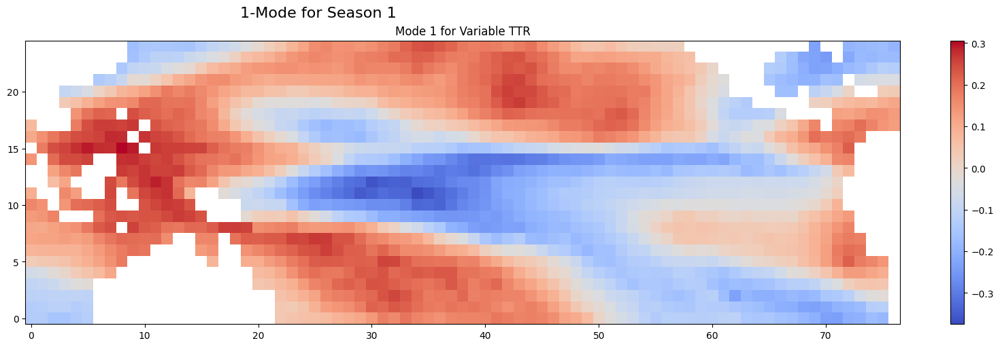

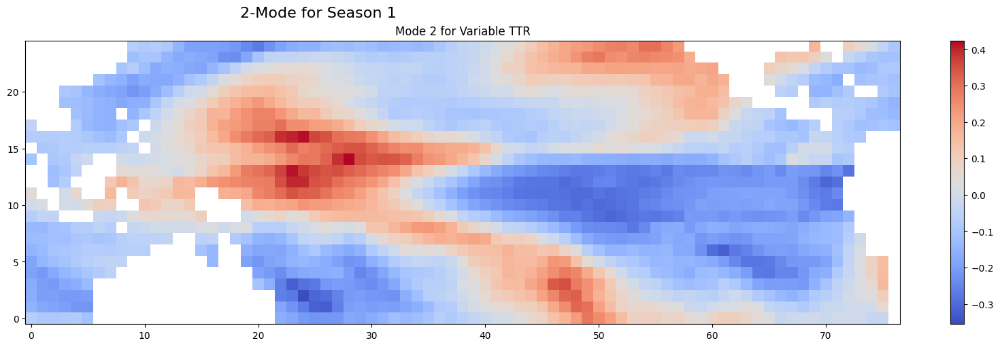

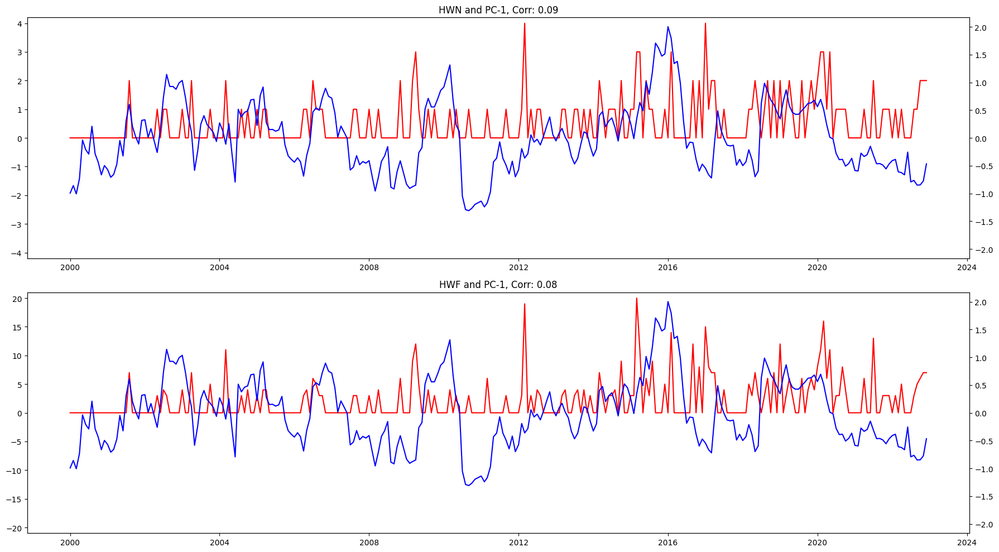

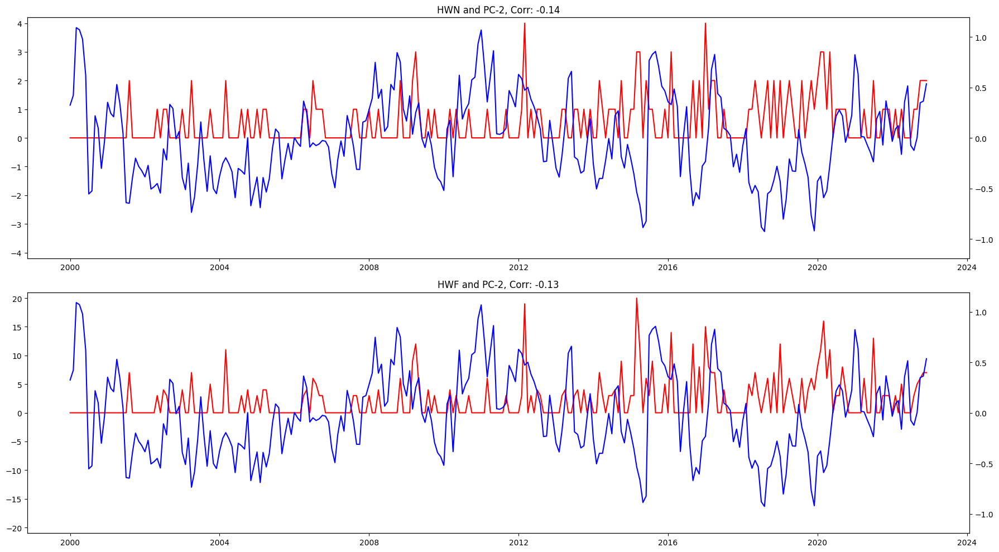

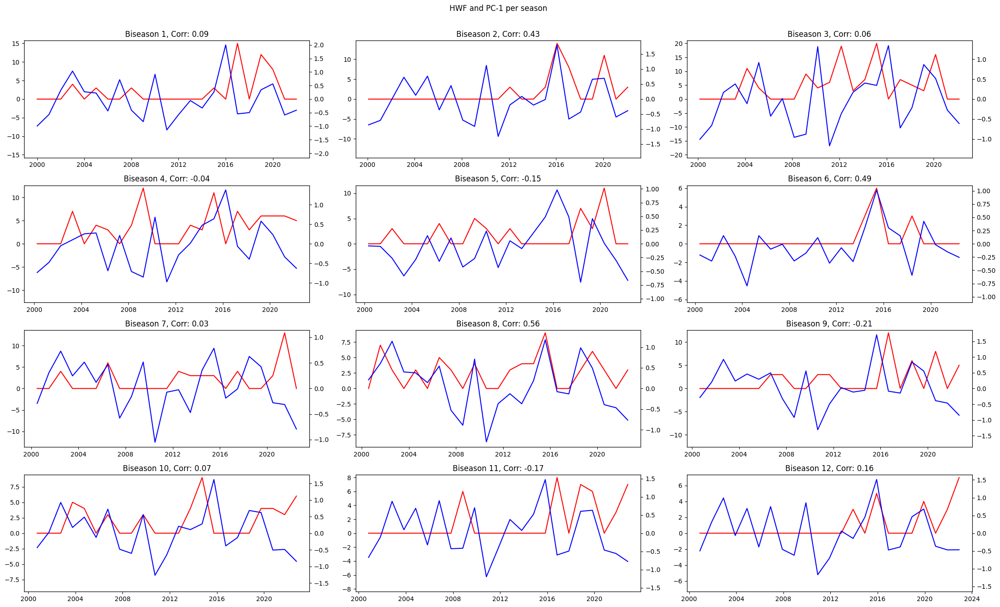

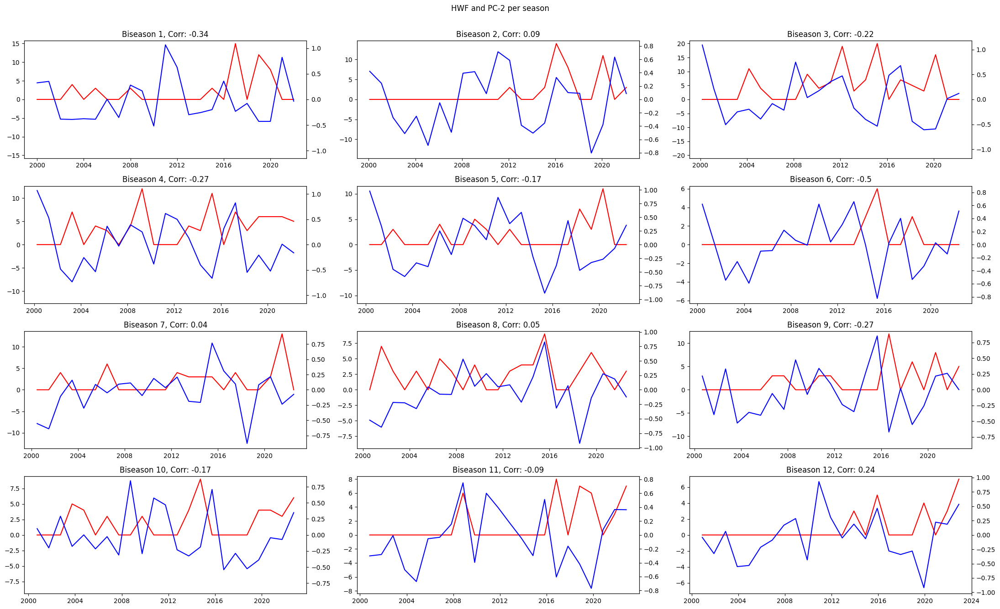

In [18]:
pca_olr = MultivariatePCA(ds_5means, 2, [1980, 2022], variables=["TTR"])
pca_olr.plot_variable_modes_shared(1)
plot_hw_index(hwis, ["HWN", "HWF"], pca_olr, 1, start=2000)
plot_hw_index(hwis, ["HWN", "HWF"], pca_olr, 2, start=2000)
plot_hw_index_by_season(hwis, "HWF", pca_olr, 1, start=2000)
plot_hw_index_by_season(hwis, "HWF", pca_olr, 2, start=2000)

### U

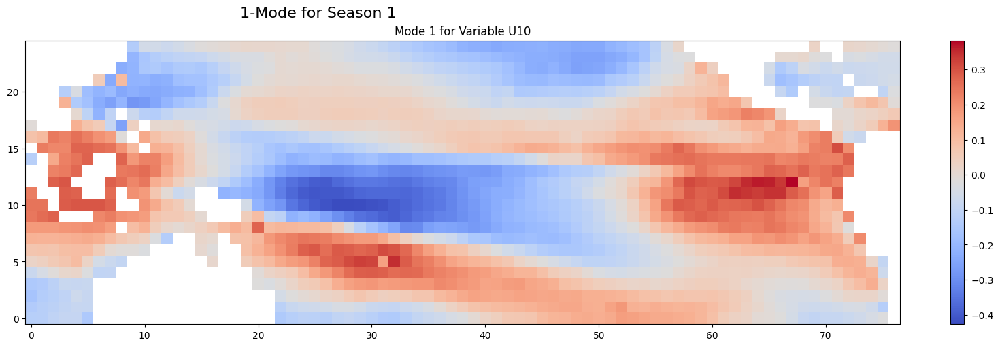

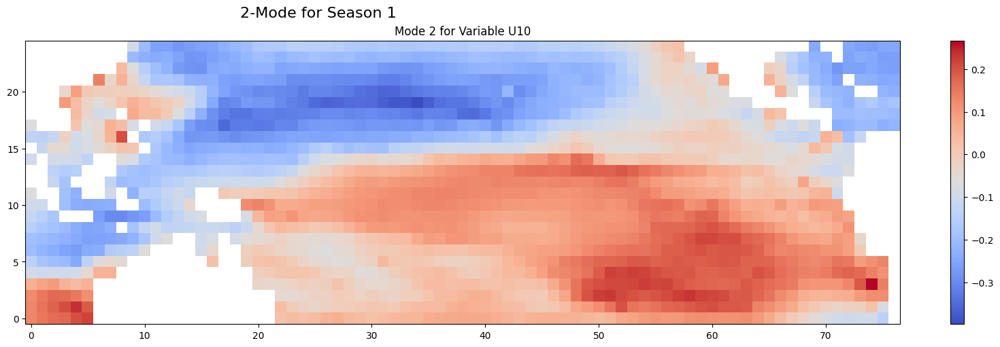

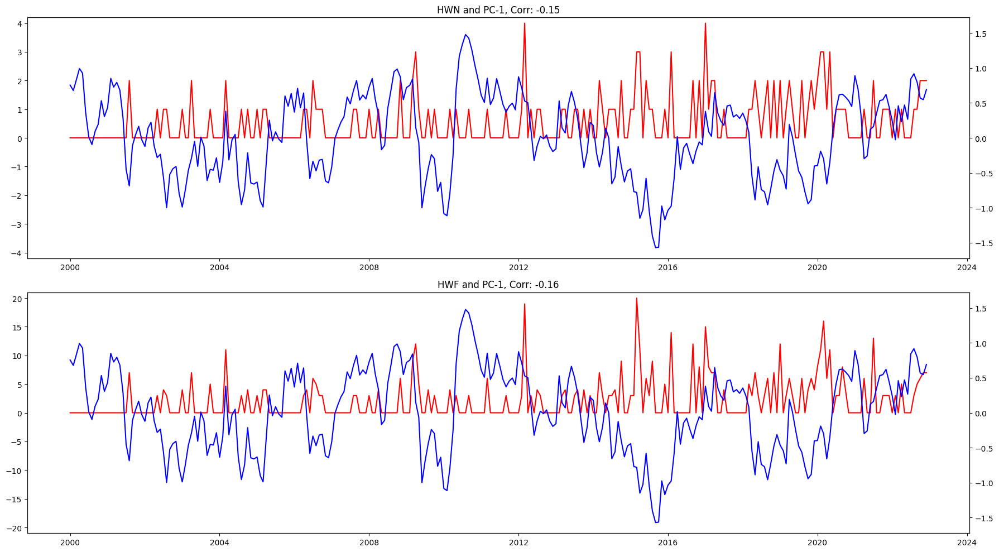

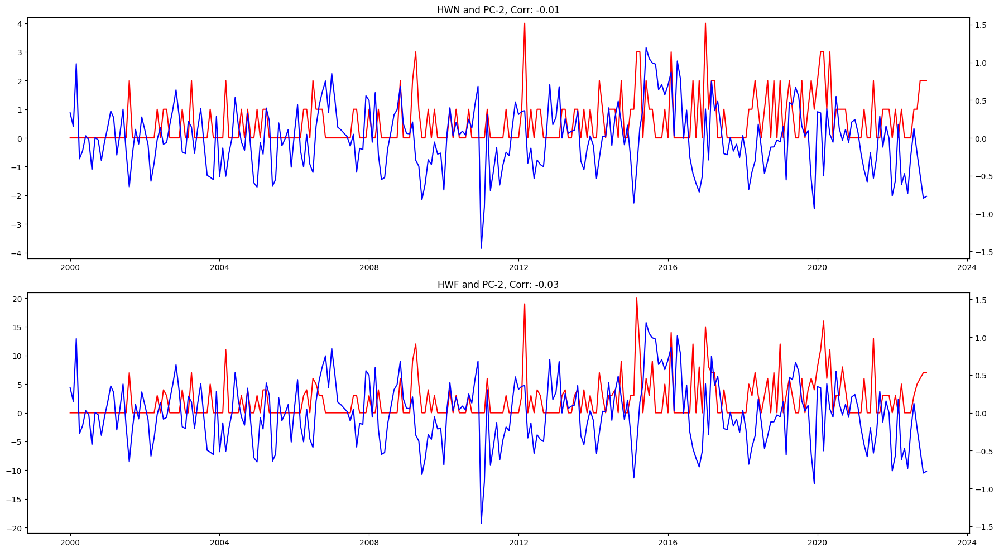

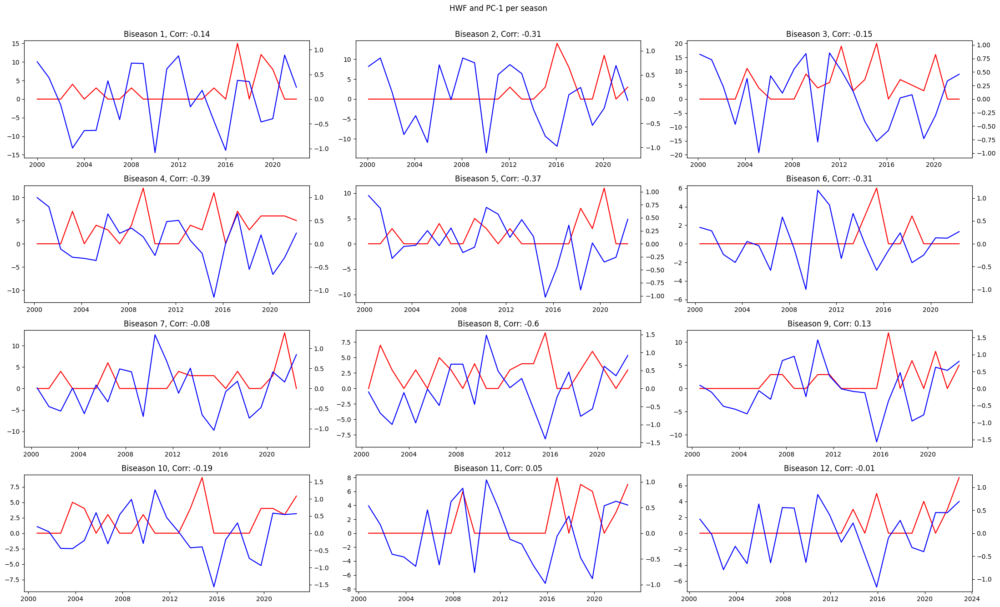

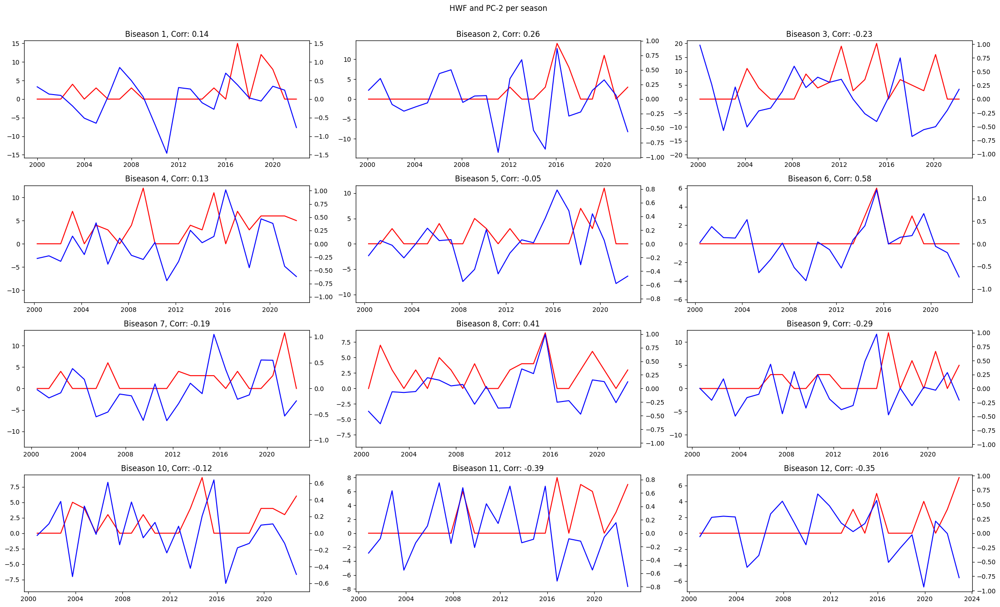

In [19]:
pca_u = MultivariatePCA(ds_5means, 2, [1980, 2022], variables=["U10"])
pca_u.plot_variable_modes_shared(1)
plot_hw_index(hwis, ["HWN", "HWF"], pca_u, 1, start=2000)
plot_hw_index(hwis, ["HWN", "HWF"], pca_u, 2, start=2000)
plot_hw_index_by_season(hwis, "HWF", pca_u, 1, start=2000)
plot_hw_index_by_season(hwis, "HWF", pca_u, 2, start=2000)

### V

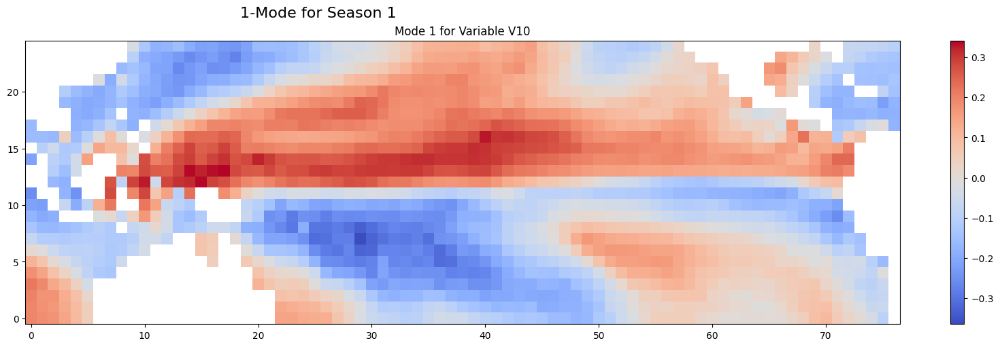

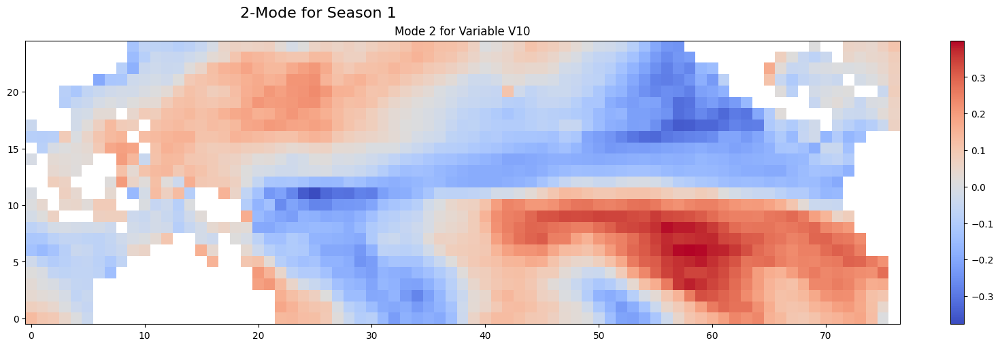

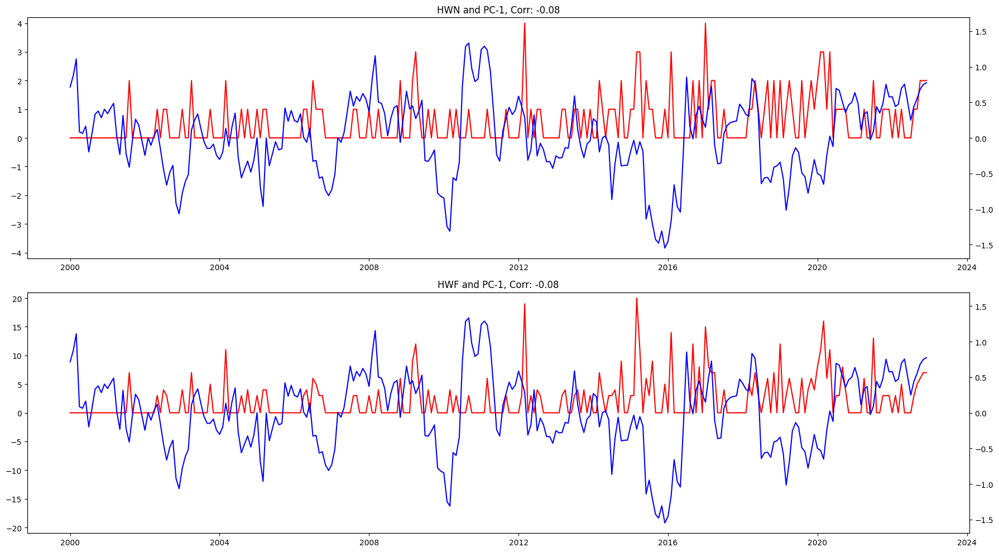

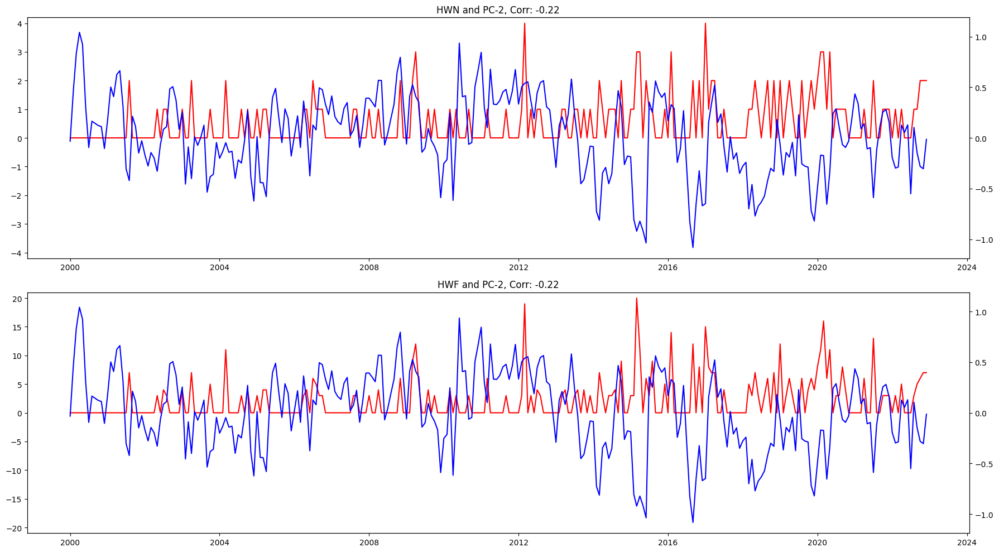

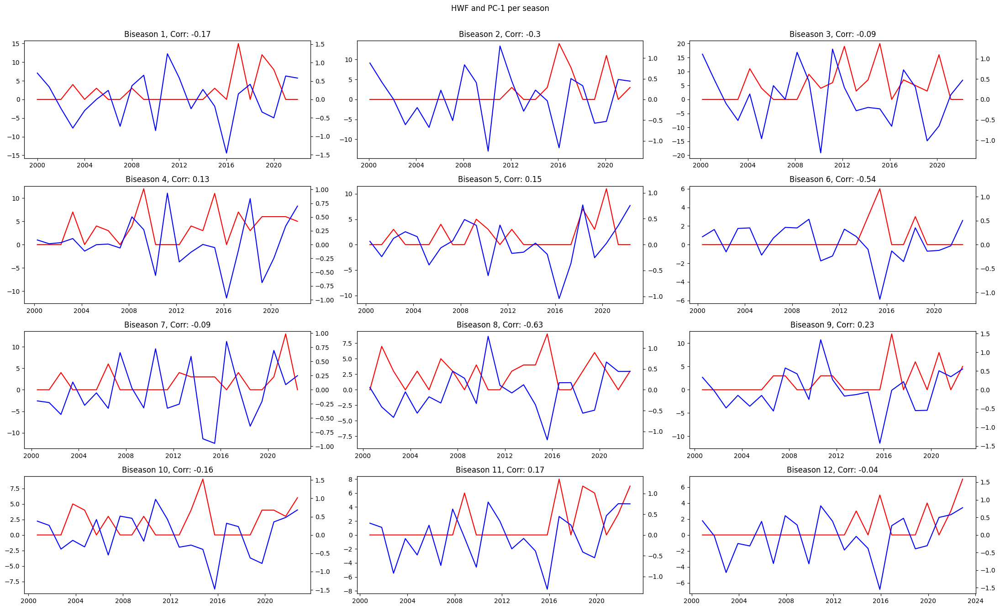

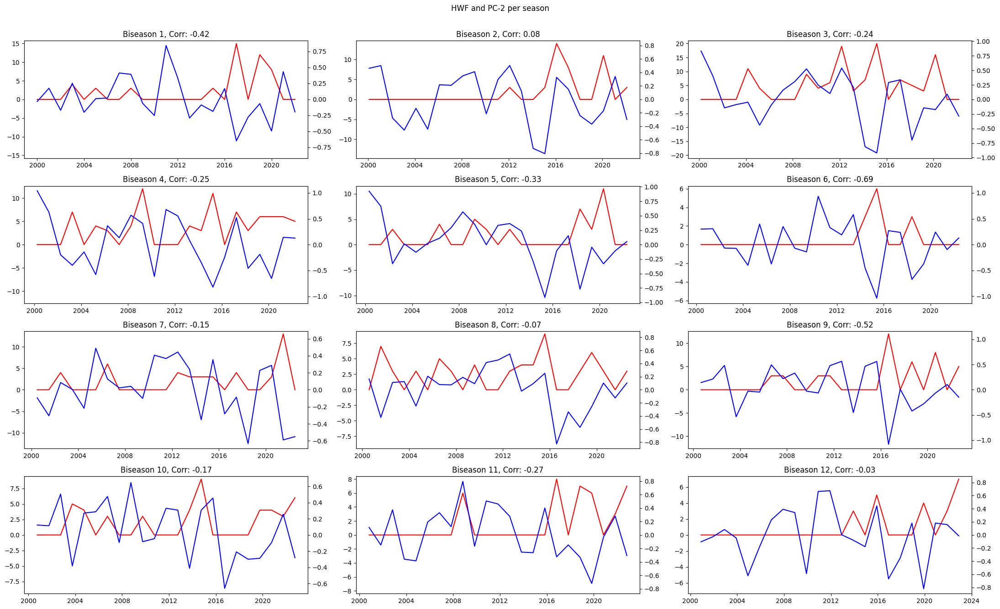

In [20]:
pca_v = MultivariatePCA(ds_5means, 2, [1980, 2022], variables=["V10"])
pca_v.plot_variable_modes_shared(1)
plot_hw_index(hwis, ["HWN", "HWF"], pca_v, 1, start=2000)
plot_hw_index(hwis, ["HWN", "HWF"], pca_v, 2, start=2000)
plot_hw_index_by_season(hwis, "HWF", pca_v, 1, start=2000)
plot_hw_index_by_season(hwis, "HWF", pca_v, 2, start=2000)

## All Correlations on MEI Box

### Quinta Normal

In [ ]:
hwis = pd.read_csv("data/local_data/HWs_330020.csv")
hwis["Date"] = pd.to_datetime(hwis["Date"],format='%Y-%m')
hwis.set_index('Date', inplace=True)

variables_pca = {
    'sst' : pca_sst,
    'sp' : pca_sp,
    'olr': pca_olr,
    'u' : pca_u,
    'v' : pca_v
}
hwis = hwis.rolling(2).mean()

hwis = hwis[(hwis.index.year <= 2022) & (hwis.index.year >= 1980)]
for mode in range(variables_pca['sst'].n_modes):
    for var, pca in variables_pca.items():
        hwis[f"{var}-Mode {mode+1}"] = pca.get_index(mode+1, start_year=1980)

In [36]:
ds_5means = xr.load_dataset("data/local_data/5means.nc")
mei = MultivariatePCA(ds_5means, 2, [1980, 2022])

In [37]:
hwis[f"MEI-Mode 1"] = mei.get_index(1, start_year=1980)
hwis[f"MEI-Mode 2"] = mei.get_index(2, start_year=1980)

In [38]:
#Lets plot the correlation betwween the indices and the modes for the full span time
corr = hwis.corr()[["HWN", "HWF", "HWD", "HWM", "HWA"]]
corr.style.background_gradient(cmap='coolwarm').format("{:.3f}")

,HWN,HWF,HWD,HWM,HWA
HWN,1.000,0.966,0.916,0.799,0.868
HWF,0.966,1.000,0.941,0.758,0.841
HWD,0.916,0.941,1.000,0.839,0.890
HWM,0.799,0.758,0.839,1.000,0.972
HWA,0.868,0.841,0.890,0.972,1.000
sst-Mode 1,0.050,0.053,0.039,0.053,0.049
sp-Mode 1,0.109,0.110,0.111,0.145,0.142
olr-Mode 1,0.084,0.077,0.072,0.131,0.121
u-Mode 1,-0.151,-0.161,-0.168,-0.188,-0.189
v-Mode 1,-0.068,-0.064,-0.049,-0.120,-0.107


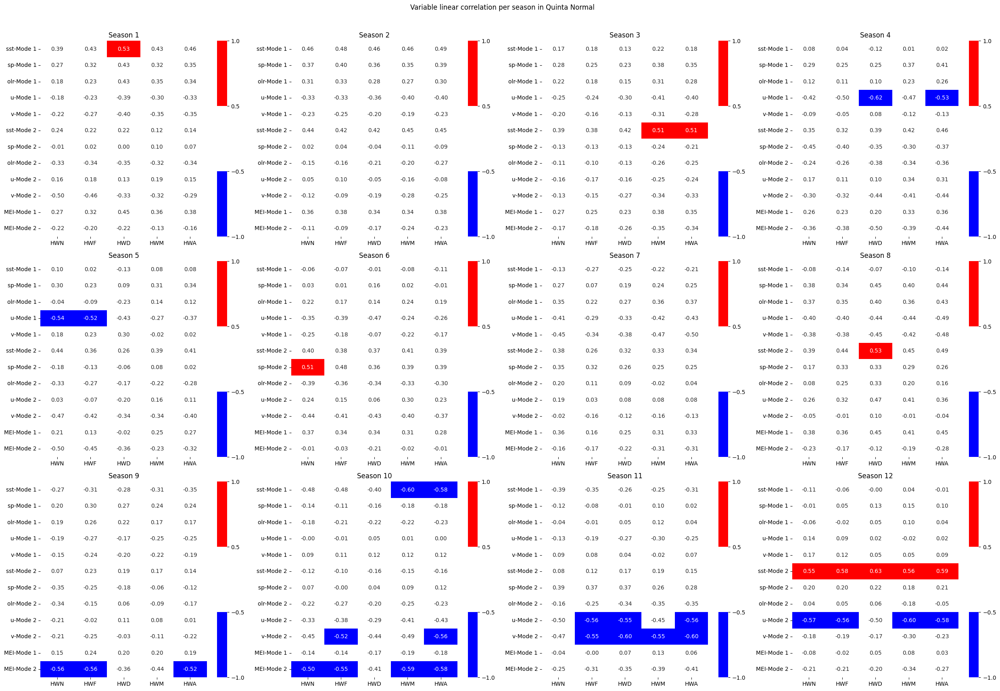

In [39]:
#We can check the correlation separated by biseason now, it appears to increase in certain boxes/seasons.
fig, axs = plt.subplots(3,4, figsize=(25,18))

colors = ["blue", "white", "red"]
cmap = ListedColormap(colors)

# Define boundaries and normalize color range
bounds = [-1, -0.5, 0.5, 1]
norm = BoundaryNorm(bounds, cmap.N)

hwis = hwis[(hwis.index.year <= 2022) & (hwis.index.year >= 2000)]
for i in range(12):
    hwis_month = hwis[hwis.index.month==i+1]
    #for var, pca in variables_pca.items():
    #    hwis_month.loc[:, f"{var}-Mode 1"] = pca.get_index_by_season(i+1, 1, start_year=2000)
    sns.heatmap(hwis_month.corr()[["HWN", "HWF", "HWD", "HWM", "HWA"]][5:], annot=True, fmt=".2f", norm=norm, cmap=cmap, ax=axs.flatten()[i], vmin=-1)
    axs.flatten()[i].set_title(f"Season {i+1}")
fig.tight_layout(rect=[0, 0.03, 1, 0.95])  # otherwise the right y-label is slightly clipped
fig.suptitle(f"Variable linear correlation per season in Quinta Normal")
plt.show()

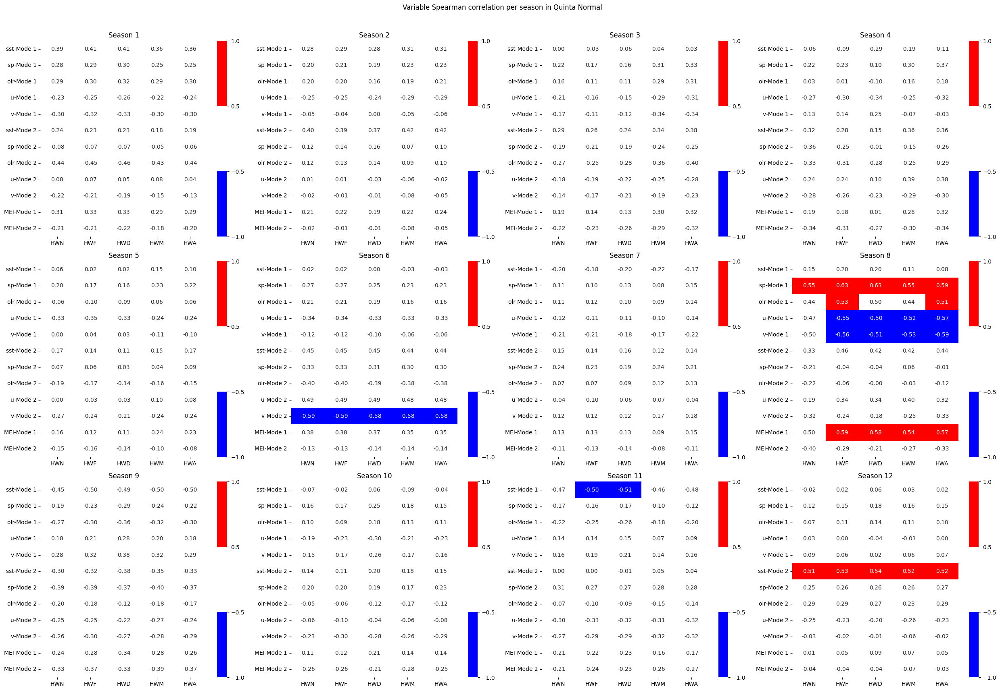

In [26]:
#We can check the correlation separated by biseason now, it appears to increase in certain boxes/seasons.
fig, axs = plt.subplots(3,4, figsize=(25,18))

hwis = hwis[(hwis.index.year <= 2022) & (hwis.index.year >= 2000)]
for i in range(12):
    hwis_month = hwis[hwis.index.month==i+1]
    #for var, pca in variables_pca.items():
    #    hwis_month.loc[:, f"{var}-Mode 1"] = pca.get_index_by_season(i+1, 1, start_year=2000)
    sns.heatmap(hwis_month.corr(method='spearman')[["HWN", "HWF", "HWD", "HWM", "HWA"]][5:], annot=True, fmt=".2f", norm=norm, cmap=cmap, ax=axs.flatten()[i], vmin=-1)
    axs.flatten()[i].set_title(f"Season {i+1}")
fig.tight_layout(rect=[0, 0.03, 1, 0.95])  # otherwise the right y-label is slightly clipped
fig.suptitle(f"Variable Spearman correlation per season in Quinta Normal")
plt.show()

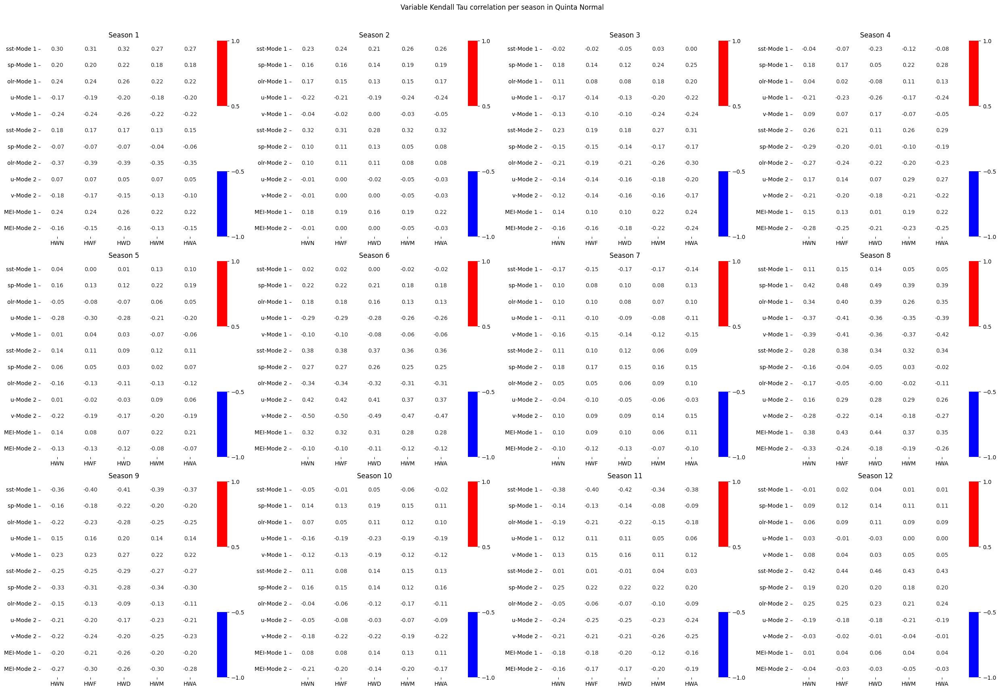

In [27]:
#We can check the correlation separated by biseason now, it appears to increase in certain boxes/seasons.
fig, axs = plt.subplots(3,4, figsize=(25,18))


hwis = hwis[(hwis.index.year <= 2022) & (hwis.index.year >= 2000)]
for i in range(12):
    hwis_month = hwis[hwis.index.month==i+1]
    #for var, pca in variables_pca.items():
    #    hwis_month.loc[:, f"{var}-Mode 1"] = pca.get_index_by_season(i+1, 1, start_year=2000)
    sns.heatmap(hwis_month.corr(method='kendall')[["HWN", "HWF", "HWD", "HWM", "HWA"]][5:], annot=True, fmt=".2f", norm=norm, cmap=cmap, ax=axs.flatten()[i], vmin=-1)
    axs.flatten()[i].set_title(f"Season {i+1}")
fig.tight_layout(rect=[0, 0.03, 1, 0.95])  # otherwise the right y-label is slightly clipped
fig.suptitle(f"Variable Kendall Tau correlation per season in Quinta Normal")
plt.show()

### Brentwood

In [40]:
hwis = pd.read_csv("data/local_data/HWs_47.csv")
hwis["Date"] = pd.to_datetime(hwis["Date"],format='%Y-%m')
hwis.set_index('Date', inplace=True)

variables_pca = {
    'sst' : pca_sst,
    'sp' : pca_sp,
    'olr': pca_olr,
    'u' : pca_u,
    'v' : pca_v
}

hwis = hwis.rolling(2).mean()

hwis = hwis[(hwis.index.year <= 2022) & (hwis.index.year >= 1989)]
for mode in range(variables_pca['sst'].n_modes):
    for var, pca in variables_pca.items():
        hwis[f"{var}-Mode {mode+1}"] = pca.get_index(mode+1, start_year=1989)

In [41]:
ds_5means = xr.load_dataset("data/local_data/5means.nc")
mei = MultivariatePCA(ds_5means, 2, [1980, 2022])

In [42]:
hwis[f"MEI-Mode 1"] = mei.get_index(1, start_year=1989)
hwis[f"MEI-Mode 2"] = mei.get_index(2, start_year=1989)

In [43]:
#Lets plot the correlation betwween the indices and the modes for the full span time
corr = hwis.corr()[["HWN", "HWF", "HWD", "HWM", "HWA"]]
corr.style.background_gradient(cmap='coolwarm').format("{:.3f}")

,HWN,HWF,HWD,HWM,HWA
HWN,1.000,0.919,0.824,0.729,0.836
HWF,0.919,1.000,0.944,0.734,0.844
HWD,0.824,0.944,1.000,0.788,0.864
HWM,0.729,0.734,0.788,1.000,0.967
HWA,0.836,0.844,0.864,0.967,1.000
sst-Mode 1,-0.164,-0.126,-0.125,-0.181,-0.190
sp-Mode 1,-0.036,-0.007,-0.005,-0.102,-0.093
olr-Mode 1,0.001,0.010,-0.002,-0.098,-0.083
u-Mode 1,-0.016,-0.017,0.005,0.086,0.072
v-Mode 1,0.027,0.016,0.030,0.102,0.097


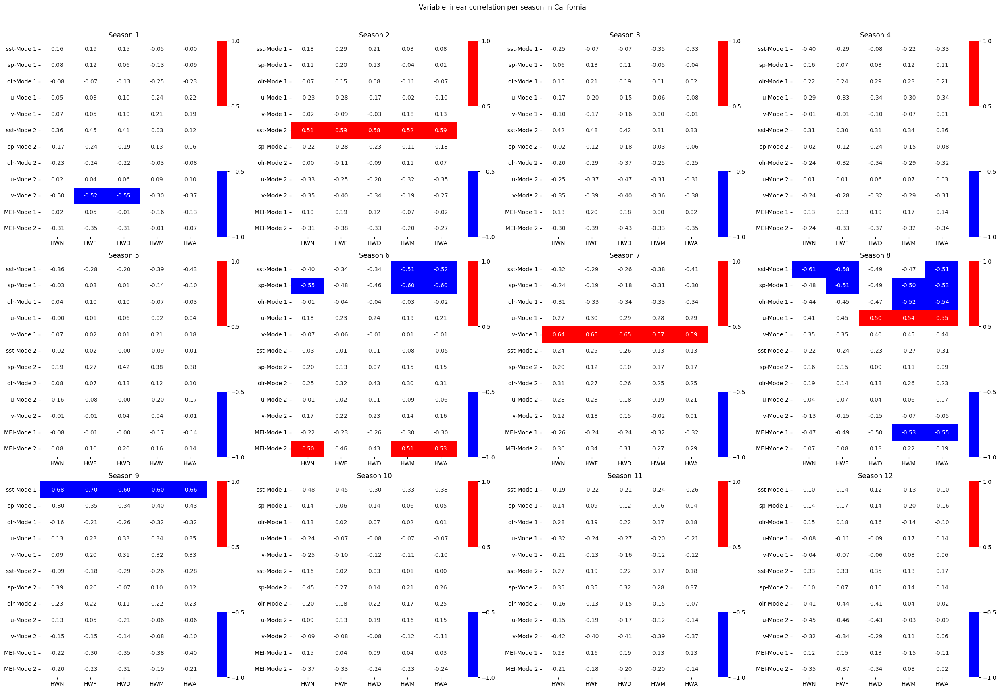

In [44]:
#We can check the correlation separated by biseason now, it appears to increase in certain boxes/seasons.
fig, axs = plt.subplots(3,4, figsize=(25,18))

hwis = hwis[(hwis.index.year <= 2022) & (hwis.index.year >= 2000)]
for i in range(12):
    hwis_month = hwis[hwis.index.month==i+1]
    #for var, pca in variables_pca.items():
    #    hwis_month.loc[:, f"{var}-Mode 1"] = pca.get_index_by_season(i+1, 1, start_year=2000)
    sns.heatmap(hwis_month.corr()[["HWN", "HWF", "HWD", "HWM", "HWA"]][5:], annot=True, fmt=".2f", cmap=cmap, norm=norm, ax=axs.flatten()[i], vmax=1, vmin=-1)
    axs.flatten()[i].set_title(f"Season {i+1}")
fig.tight_layout(rect=[0, 0.03, 1, 0.95])  # otherwise the right y-label is slightly clipped
fig.suptitle(f"Variable linear correlation per season in California")
plt.show()

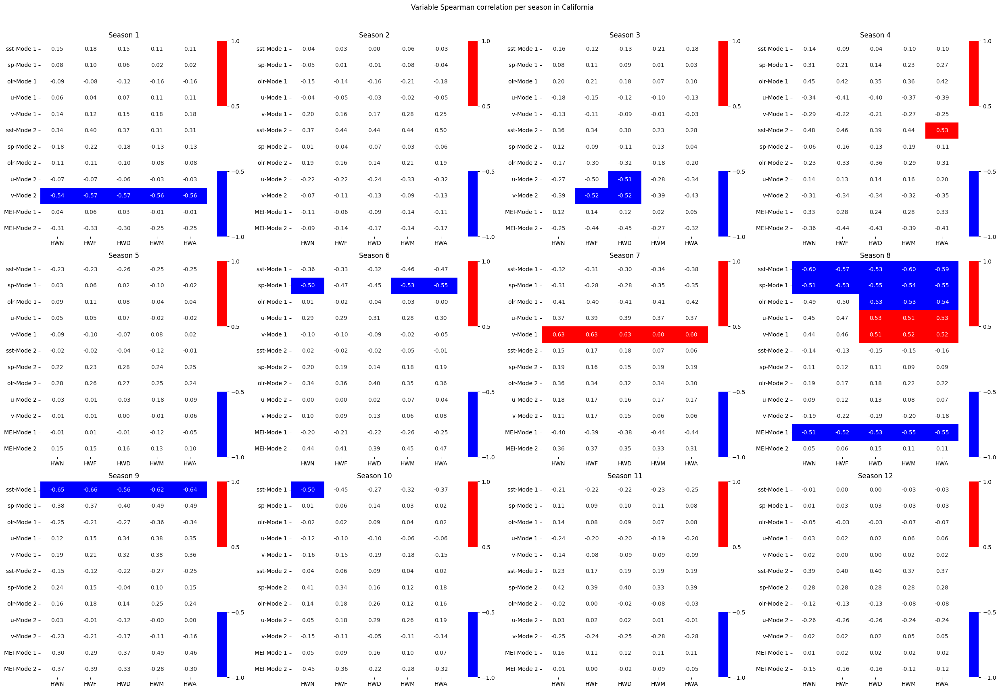

In [45]:
#We can check the correlation separated by biseason now, it appears to increase in certain boxes/seasons.
fig, axs = plt.subplots(3,4, figsize=(25,18))

hwis = hwis[(hwis.index.year <= 2022) & (hwis.index.year >= 2000)]
for i in range(12):
    hwis_month = hwis[hwis.index.month==i+1]
    #for var, pca in variables_pca.items():
    #    hwis_month.loc[:, f"{var}-Mode 1"] = pca.get_index_by_season(i+1, 1, start_year=2000)
    sns.heatmap(hwis_month.corr(method='spearman')[["HWN", "HWF", "HWD", "HWM", "HWA"]][5:], annot=True, fmt=".2f", cmap=cmap, norm=norm, ax=axs.flatten()[i], vmax=1, vmin=-1)
    axs.flatten()[i].set_title(f"Season {i+1}")
fig.tight_layout(rect=[0, 0.03, 1, 0.95])  # otherwise the right y-label is slightly clipped
fig.suptitle(f"Variable Spearman correlation per season in California")
plt.show()

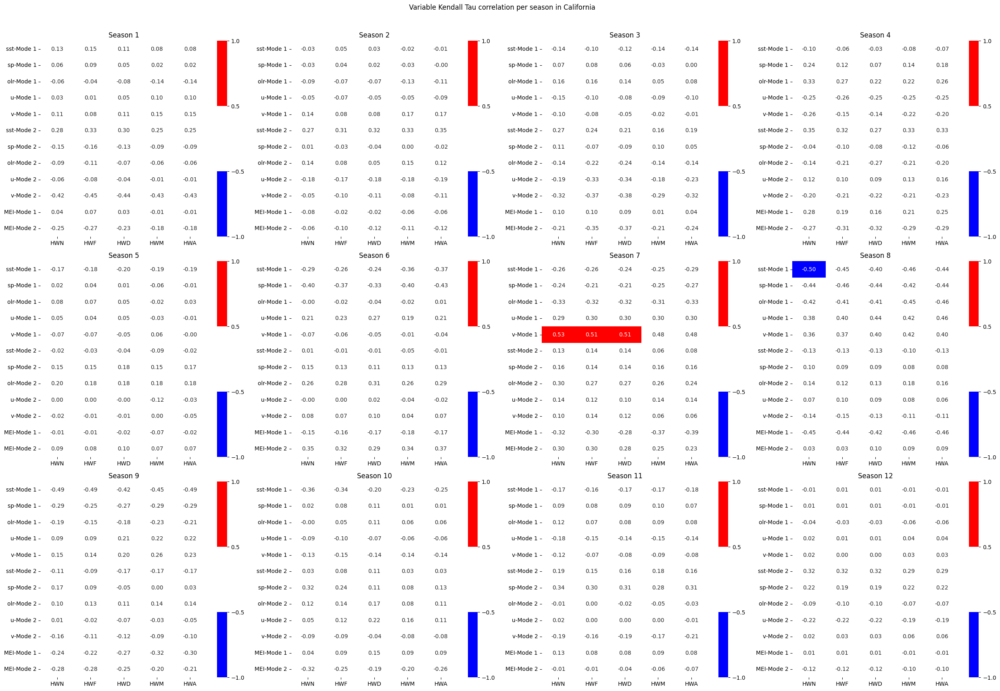

In [46]:
#We can check the correlation separated by biseason now, it appears to increase in certain boxes/seasons.
fig, axs = plt.subplots(3,4, figsize=(25,18))

hwis = hwis[(hwis.index.year <= 2022) & (hwis.index.year >= 2000)]
for i in range(12):
    hwis_month = hwis[hwis.index.month==i+1]
    #for var, pca in variables_pca.items():
    #    hwis_month.loc[:, f"{var}-Mode 1"] = pca.get_index_by_season(i+1, 1, start_year=2000)
    sns.heatmap(hwis_month.corr(method='kendall')[["HWN", "HWF", "HWD", "HWM", "HWA"]][5:], annot=True, fmt=".2f", cmap=cmap, norm=norm, ax=axs.flatten()[i], vmax=1, vmin=-1)
    axs.flatten()[i].set_title(f"Season {i+1}")
fig.tight_layout(rect=[0, 0.03, 1, 0.95])  # otherwise the right y-label is slightly clipped
fig.suptitle(f"Variable Kendall Tau correlation per season in California")
plt.show()